##### Dataset:
https://www.kaggle.com/datasets/vishakhdapat/customer-segmentation-clustering

In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
pd.set_option('display.max_columns', None)

In [187]:
import warnings
warnings.filterwarnings('ignore')

In [114]:
os.getcwd()

'c:\\Mounika\\All Projects\\customer-segmentation\\notebook'

In [115]:
# Define the path to the dataset
dataset_path= os.path.join("data","raw_data","customer_segmentation.csv")
# Read the dataset
df= pd.read_csv(dataset_path)
# Display the first few rows of the dataframe
df.head()


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [116]:
df.shape

(2240, 29)

In [117]:
# Display the basic information about the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [118]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [119]:
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [120]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [121]:
# Find the list of missing columns
columns_with_missing_values = df.columns[df.isnull().any()].tolist()
print("Columns with missing values:", columns_with_missing_values)

Columns with missing values: ['Income']


In [122]:
# Find the percentage of missing values in each column
for col in columns_with_missing_values:
    missing_percentage = df[col].isnull().mean() * 100
    print(f"Percentage of missing values in '{col}': {missing_percentage:.2f}%")

Percentage of missing values in 'Income': 1.07%


In [123]:
# Create a copy of the dataframe for further analysis
df_copy= df.copy()
df_copy.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [124]:
# Check for the duplicate rows in the dataframe
duplicate_rows = df_copy.duplicated()
print(f"Number of duplicate rows: {duplicate_rows.sum()}")

Number of duplicate rows: 0


In [125]:
# Check for the duplicate columns in the dataframe
duplicate_columns = df_copy.columns[df_copy.T.duplicated()]
print(f"Duplicate columns: {duplicate_columns.tolist()}")

Duplicate columns: []


In [126]:
# Check for the duplicate columns im terms of the value
duplicate_columns_values = df_copy.columns[df_copy.T.duplicated()].tolist()
print("Duplicate columns based on values:", duplicate_columns_values)

Duplicate columns based on values: []


In [127]:
# How to remove the duplicate columns
df_copy= df_copy.loc[:,~df_copy.columns.duplicated()]
df_copy.shape

(2240, 29)

In [128]:
# Find the junk columns and remove them
junk_columns= [col for col in df_copy.columns if df_copy[col].nunique()<2 or 'unnamed' in col.lower()]
print("Junk columns:", junk_columns)



Junk columns: ['Z_CostContact', 'Z_Revenue']


In [129]:
df['Z_CostContact'].nunique()


1

In [130]:
df['Z_Revenue'].nunique()

1

In [131]:
# The above columns have only one unique value, in unsupervised learning, the model tries to group similar data points based on feature differences. Since these columns do not provide any variability or distinguishing information, they do not contribute to the clustering process. Therefore, they can be considered redundant and removed from the dataset to streamline the analysis.
# Remove the junk columns from the dataframe
df_copy.drop(columns= junk_columns, inplace= True)

In [132]:
df_copy.shape

(2240, 27)

In [133]:
# See if there are any columns with white spaces
columns_with_spaces= df_copy.columns[df_copy.columns.str.contains(' ')]
if columns_with_spaces.empty:
    print("No columns with white spaces found.")
df_copy.columns = df_copy.columns.str.strip()


No columns with white spaces found.


In [134]:
# Drop the column ID
df_copy.drop(columns= 'ID', inplace= True)
df_copy.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0


In [135]:
# Display the columns with their unique value count
for col in df_copy.columns:
    print(f"Column: {col}")
    print(f"unique values count : {df_copy[col].nunique()}")
   # print(f"unique values : {df_copy[col].unique()}")
    print("-" * 40)

Column: Year_Birth
unique values count : 59
----------------------------------------
Column: Education
unique values count : 5
----------------------------------------
Column: Marital_Status
unique values count : 8
----------------------------------------
Column: Income
unique values count : 1974
----------------------------------------
Column: Kidhome
unique values count : 3
----------------------------------------
Column: Teenhome
unique values count : 3
----------------------------------------
Column: Dt_Customer
unique values count : 663
----------------------------------------
Column: Recency
unique values count : 100
----------------------------------------
Column: MntWines
unique values count : 776
----------------------------------------
Column: MntFruits
unique values count : 158
----------------------------------------
Column: MntMeatProducts
unique values count : 558
----------------------------------------
Column: MntFishProducts
unique values count : 182
------------------

In [136]:
# Find the unique values in the each column
for col in df_copy.columns:
    print(f"Column: {col}")
    print(f"Unique values: {df_copy[col].unique()}")
    print("-" * 40)

Column: Year_Birth
Unique values: [1957 1954 1965 1984 1981 1967 1971 1985 1974 1950 1983 1976 1959 1952
 1987 1946 1980 1949 1982 1979 1951 1969 1986 1989 1963 1970 1973 1943
 1975 1996 1968 1964 1977 1978 1955 1966 1988 1948 1958 1972 1960 1945
 1991 1962 1953 1961 1956 1992 1900 1893 1990 1947 1899 1993 1994 1941
 1944 1995 1940]
----------------------------------------
Column: Education
Unique values: ['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']
----------------------------------------
Column: Marital_Status
Unique values: ['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']
----------------------------------------
Column: Income
Unique values: [58138. 46344. 71613. ... 56981. 69245. 52869.]
----------------------------------------
Column: Kidhome
Unique values: [0 1 2]
----------------------------------------
Column: Teenhome
Unique values: [0 1 2]
----------------------------------------
Column: Dt_Customer
Unique values: ['04-09-2012' '08-03-2014' '21-0

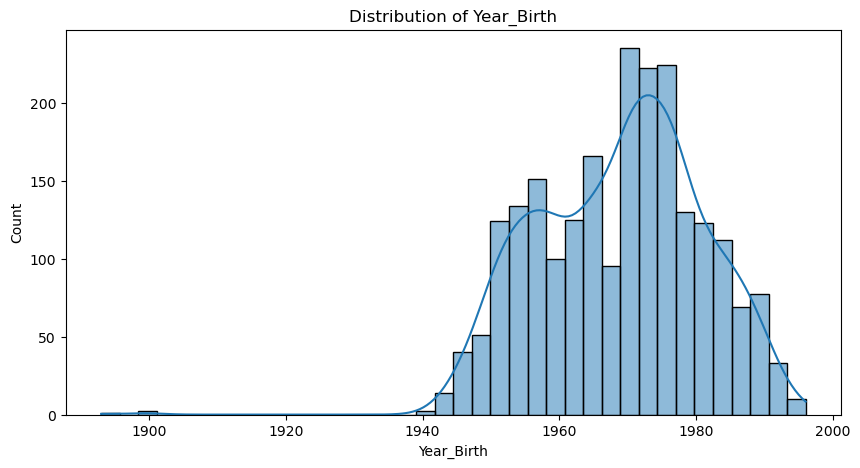

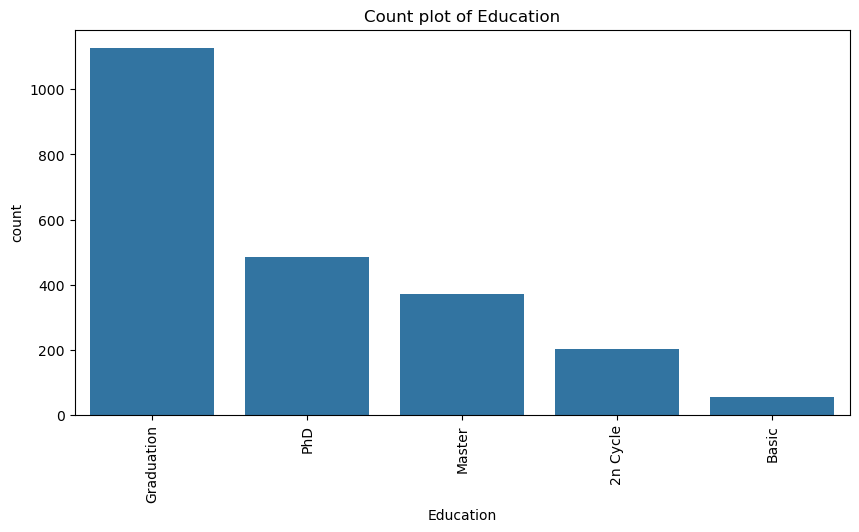

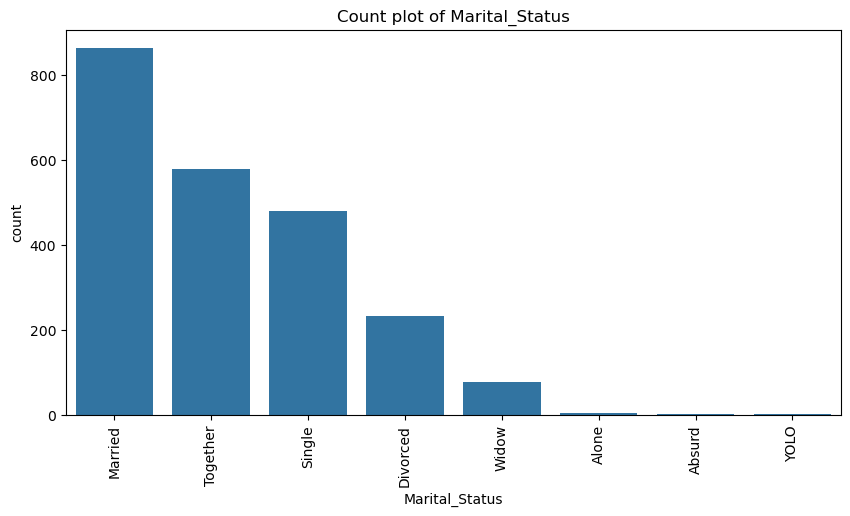

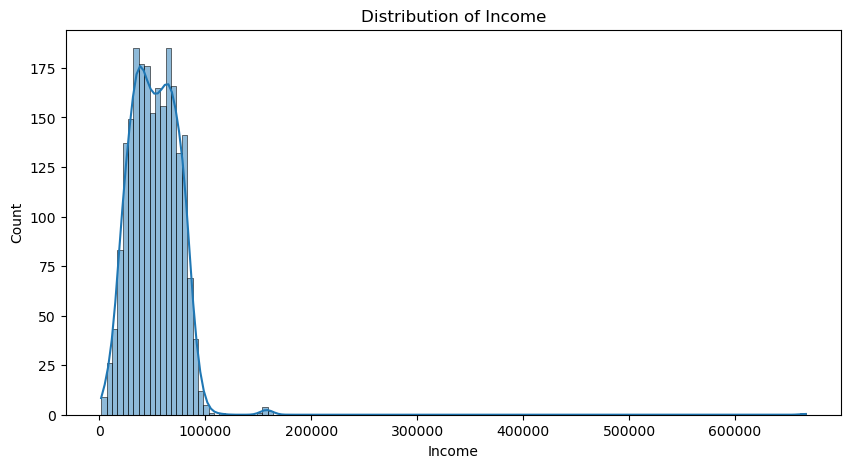

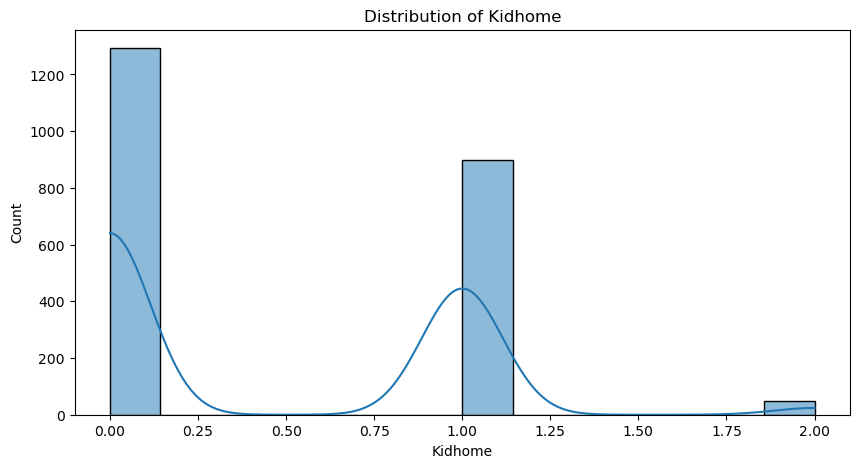

...

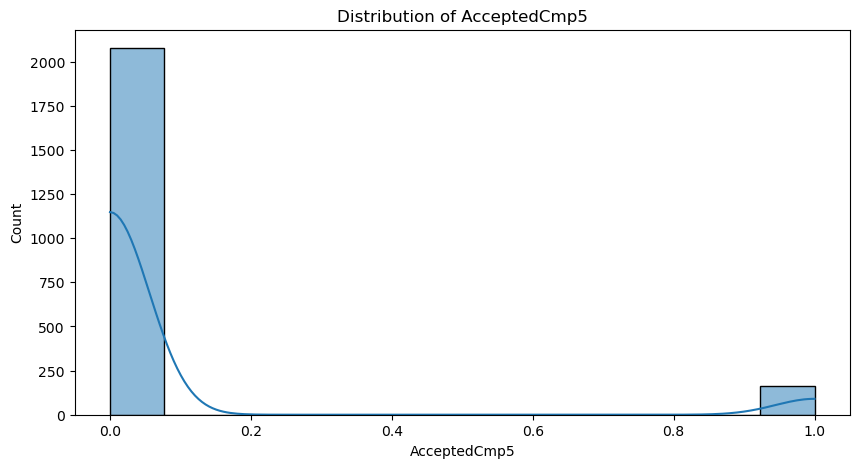

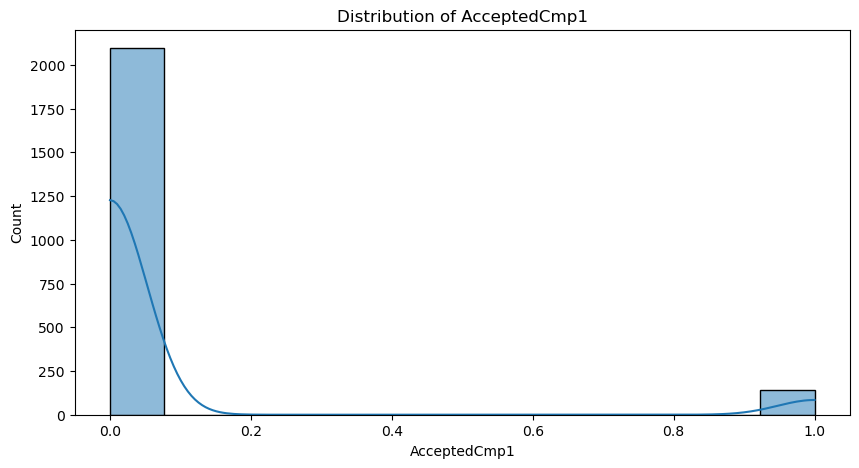

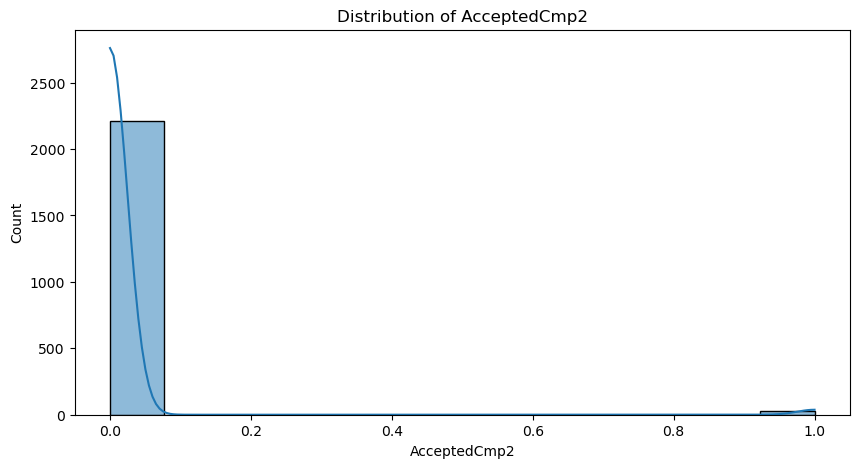

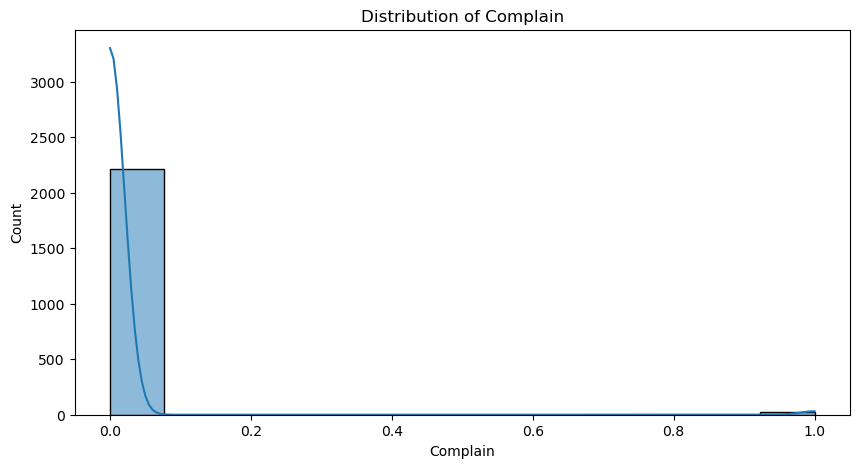

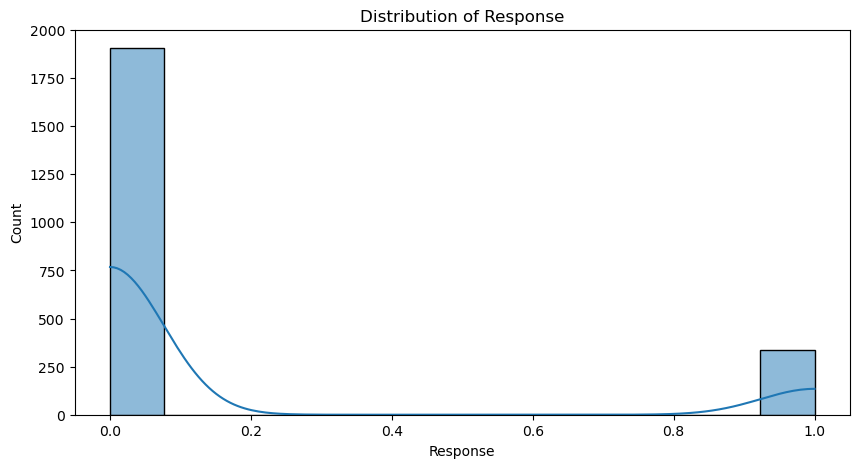

In [137]:
# Univariate analysis
def univariate_analysis(df_copy):
    for col in df_copy.columns:
        if df_copy[col].dtype == 'object':
           plt.figure(figsize=(10, 5))
           sns.countplot(x=df_copy[col], order=df_copy[col].value_counts().index)
           plt.title(f"Count plot of {col}")
           plt.xticks(rotation=90)
           plt.show()
        else:
            plt.figure(figsize=(10, 5))
            sns.histplot(df_copy[col], kde=True)
            plt.title(f"Distribution of {col}")
            plt.show()
univariate_analysis(df_copy)

#### Let's do some more data cleaning and feature engineering

In [138]:
df_copy['Education'].value_counts()

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

In [139]:
df_copy['Marital_Status'].value_counts()

Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [140]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2240 non-null   int64  
 1   Education            2240 non-null   object 
 2   Marital_Status       2240 non-null   object 
 3   Income               2216 non-null   float64
 4   Kidhome              2240 non-null   int64  
 5   Teenhome             2240 non-null   int64  
 6   Dt_Customer          2240 non-null   object 
 7   Recency              2240 non-null   int64  
 8   MntWines             2240 non-null   int64  
 9   MntFruits            2240 non-null   int64  
 10  MntMeatProducts      2240 non-null   int64  
 11  MntFishProducts      2240 non-null   int64  
 12  MntSweetProducts     2240 non-null   int64  
 13  MntGoldProds         2240 non-null   int64  
 14  NumDealsPurchases    2240 non-null   int64  
 15  NumWebPurchases      2240 non-null   i

In [141]:
# pd.to_datetime(...) converts string/object to datetime format and dayfirst=True indicates that the day comes first in the date format while interpreting the date.
# datefirst=True - controls how pandas interprets the order of day and month in date strings.
df_copy['Dt_Customer']=pd.to_datetime(df_copy['Dt_Customer'], dayfirst= True)

In [142]:
# Find the data type of the column Dt_Customer
df_copy['Dt_Customer'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 2240 entries, 0 to 2239
Series name: Dt_Customer
Non-Null Count  Dtype         
--------------  -----         
2240 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 17.6 KB


In [143]:
# YYYY-MM-DD- THis is the default display format for datetime in pandas
df_copy['Dt_Customer'].head()

0   2012-09-04
1   2014-03-08
2   2013-08-21
3   2014-02-10
4   2014-01-19
Name: Dt_Customer, dtype: datetime64[ns]

In [144]:
# Create a age column from the Year_Birth
from datetime import datetime
df_copy['Age']= datetime.now().year - df['Year_Birth']

In [145]:
df_copy['Age']

0       68
1       71
2       60
3       41
4       44
        ..
2235    58
2236    79
2237    44
2238    69
2239    71
Name: Age, Length: 2240, dtype: int64

In [146]:
df_copy['Total_Children']= df_copy['Kidhome'] + df_copy['Teenhome']

In [147]:
df_copy['Total_Children']

0       0
1       2
2       0
3       1
4       1
       ..
2235    1
2236    3
2237    0
2238    1
2239    2
Name: Total_Children, Length: 2240, dtype: int64

In [148]:
df_copy['Total_Spending']= df_copy['MntWines'] + df_copy['MntFruits'] + df_copy['MntMeatProducts'] + df_copy['MntFishProducts'] + df_copy['MntSweetProducts'] + df_copy['MntGoldProds']

In [149]:
df_copy['Total_Spending']

0       1617
1         27
2        776
3         53
4        422
        ... 
2235    1341
2236     444
2237    1241
2238     843
2239     172
Name: Total_Spending, Length: 2240, dtype: int64

In [150]:
# customer tenure
df_copy['Customer_Tenure_Days']= (datetime.now() - df_copy['Dt_Customer']).dt.days

In [151]:
df_copy['Customer_Tenure_Days']

0       4794
1       4244
2       4443
3       4270
4       4292
        ... 
2235    4512
2236    4150
2237    4286
2238    4287
2239    4753
Name: Customer_Tenure_Days, Length: 2240, dtype: int64

#### Let's do Exploratory data analysis

In [152]:
numerical_columns= df_copy.select_dtypes(include= np.number).columns.tolist()
categorical_columns= df_copy.select_dtypes(include= 'object').columns.tolist()
print("Numerical columns:", numerical_columns)
print("Categorical columns:", categorical_columns)

Numerical columns: ['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Total_Children', 'Total_Spending', 'Customer_Tenure_Days']
Categorical columns: ['Education', 'Marital_Status']


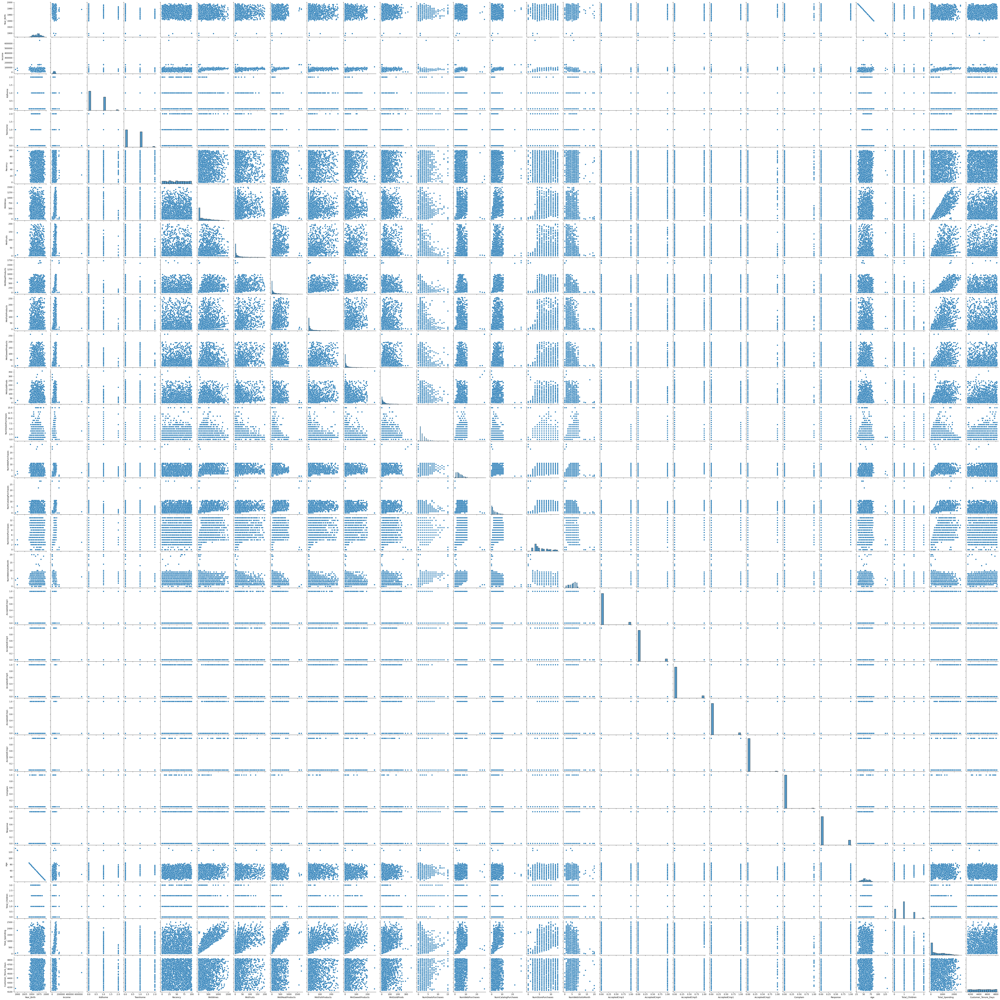

In [153]:
sns.pairplot(df_copy[numerical_columns])

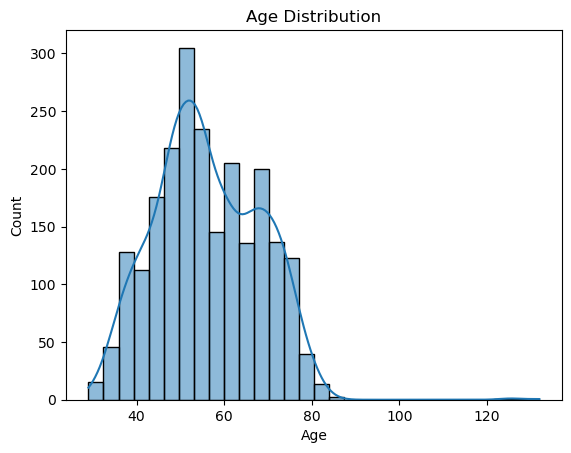

In [154]:
# Histogram for age column
sns.histplot(df_copy['Age'],bins=30, kde= True)
plt.title("Age Distribution")
plt.show()

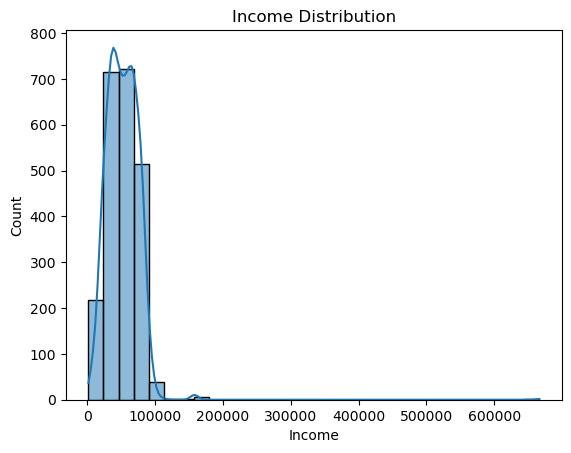

In [155]:
# Histogram for income column
sns.histplot(df_copy['Income'],bins=30, kde= True)
plt.title("Income Distribution")
plt.show()

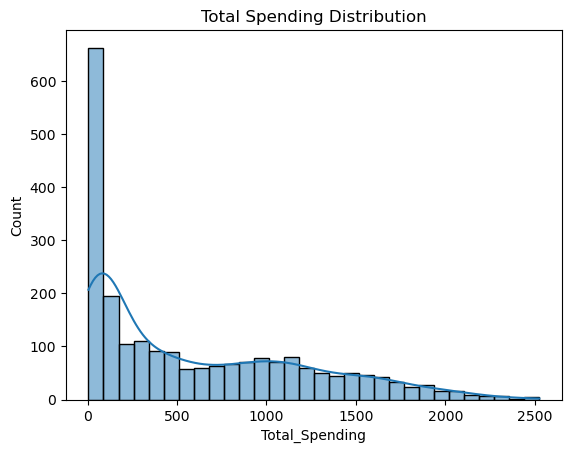

In [156]:
# Histogram for Total_Spending column
sns.histplot(df_copy['Total_Spending'],bins=30, kde= True)
plt.title("Total Spending Distribution")
plt.show()

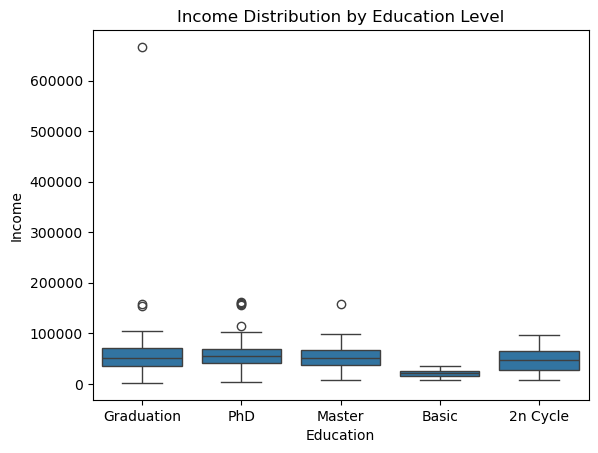

In [157]:
sns.boxplot(x='Education', y='Income', data=df_copy)
plt.title("Income Distribution by Education Level")
plt.show()

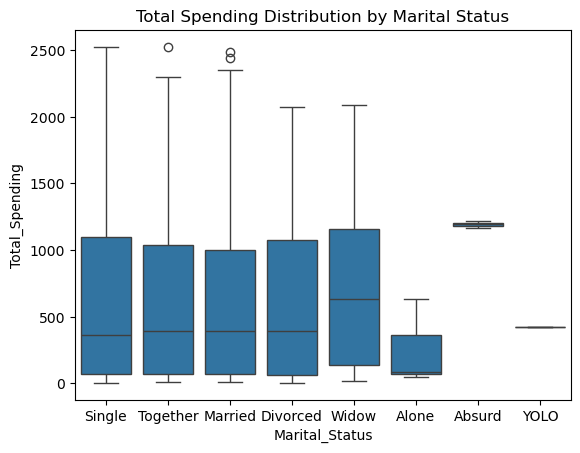

In [158]:
sns.boxplot(x='Marital_Status', y='Total_Spending', data=df_copy)
plt.title("Total Spending Distribution by Marital Status")
plt.show()

In [159]:
# Multivariate analysis can be done to understand the relationship between multiple features and the target variable (Survived).
def multivariate_analysis(df_copy, numerical_columns):
    plt.figure(figsize=(15, 10))
    sns.heatmap(df_copy[numerical_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix')
    plt.tight_layout()
    plt.show()  

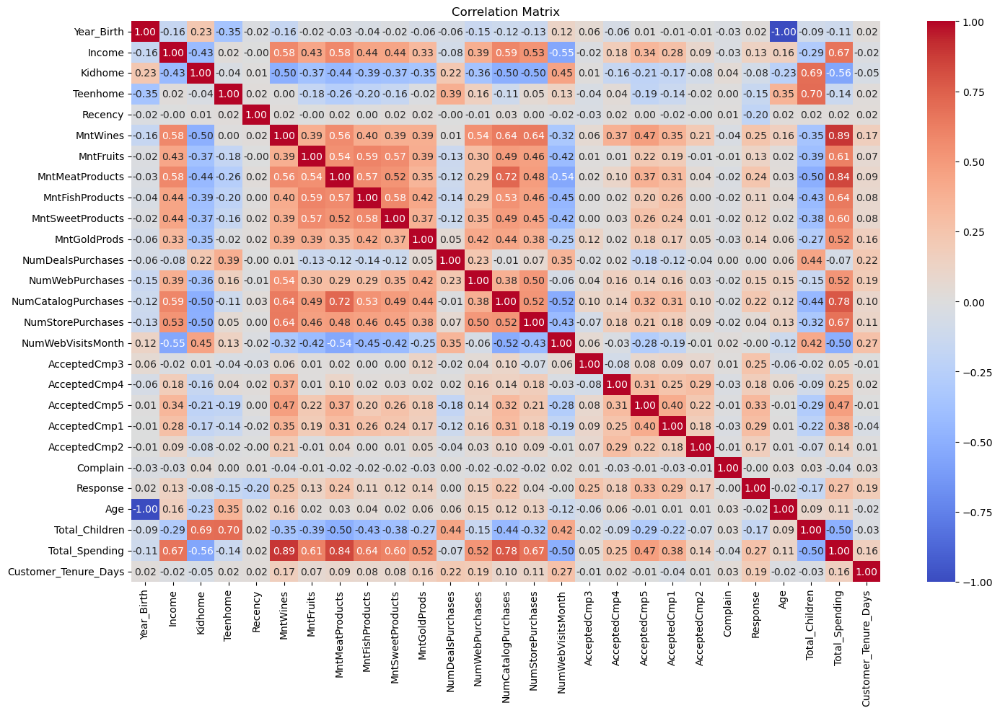

In [160]:
if numerical_columns:
    multivariate_analysis(df_copy, numerical_columns)
else:
    print("No numerical columns available for multivariate analysis.")

In [161]:
# SElect the numerical columns for correlation matrix
corr=df_copy[['Income','Age','Recency','Total_Spending','NumWebPurchases','NumStorePurchases']].corr()

In [162]:
corr

,Income,Age,Recency,Total_Spending,NumWebPurchases,NumStorePurchases
Income,1.000000,0.161791,-0.003970,0.667576,0.387878,0.529362
Age,0.161791,1.000000,0.019871,0.111306,0.145040,0.128272
Recency,-0.003970,0.019871,1.000000,0.020433,-0.010726,0.000799
Total_Spending,0.667576,0.111306,0.020433,1.000000,0.519837,0.674669
NumWebPurchases,0.387878,0.145040,-0.010726,0.519837,1.000000,0.502713
NumStorePurchases,0.529362,0.128272,0.000799,0.674669,0.502713,1.000000


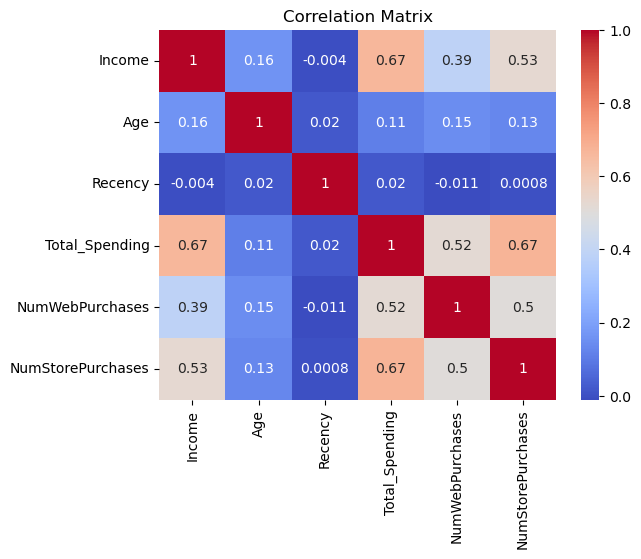

In [163]:
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [164]:
# Pivot table for Education vs Income 
income_pivot= pd.pivot_table(data=df_copy,values='Income', index='Education',columns='Marital_Status', aggfunc= 'mean')
income_pivot

Marital_Status,Absurd,Alone,Divorced,Married,Single,Together,Widow,YOLO
Education,,,,,,,,
2n Cycle,NaN,NaN,49395.130435,46201.100000,53673.944444,44736.410714,51392.200000,NaN
Basic,NaN,NaN,9548.000000,21960.500000,18238.666667,21240.071429,22123.000000,NaN
Graduation,79244.0,34176.0,54526.042017,50800.258741,51322.182927,55758.480702,54976.657143,NaN
Master,65487.0,61331.0,50331.945946,53286.028986,53530.560000,52109.009804,58401.545455,NaN
PhD,NaN,35860.0,53096.615385,58138.031579,53314.614583,56041.422414,60288.083333,48432.0


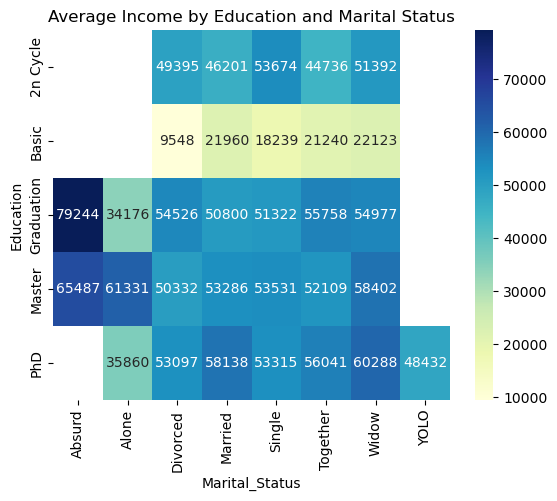

In [165]:
sns.heatmap(income_pivot, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title("Average Income by Education and Marital Status")
plt.show()

In [166]:
group1= df_copy.groupby('Education')['Total_Spending'].mean().sort_values(ascending=False)

In [167]:
group1

Education
PhD           672.409465
Graduation    619.898846
Master        611.781081
2n Cycle      496.527094
Basic          81.796296
Name: Total_Spending, dtype: float64

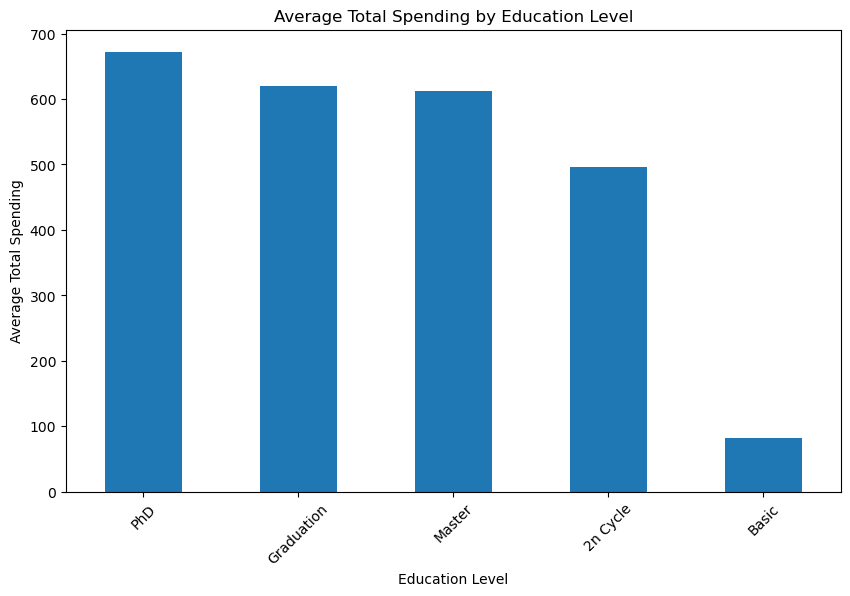

In [168]:
group1.plot(kind='bar', figsize=(10, 6))
plt.title('Average Total Spending by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Average Total Spending')
plt.xticks(rotation=45)
plt.show()

In [169]:
df_copy['AcceptedAny']=df_copy[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']].sum(axis=1)    

In [170]:
df_copy['AcceptedAny'].unique()

array([1, 0, 3, 2, 4, 5], dtype=int64)

In [171]:
df_copy['AcceptedAny']=df_copy['AcceptedAny'].apply(lambda x: 1 if x>0 else 0)

In [172]:
df_copy['AcceptedAny'].unique()

array([1, 0], dtype=int64)

In [173]:
group2= df_copy.groupby('Marital_Status')['AcceptedAny'].mean().sort_values(ascending=False)

In [174]:
group2

Marital_Status
Absurd      0.500000
YOLO        0.500000
Widow       0.350649
Alone       0.333333
Single      0.308333
Divorced    0.297414
Married     0.251157
Together    0.250000
Name: AcceptedAny, dtype: float64

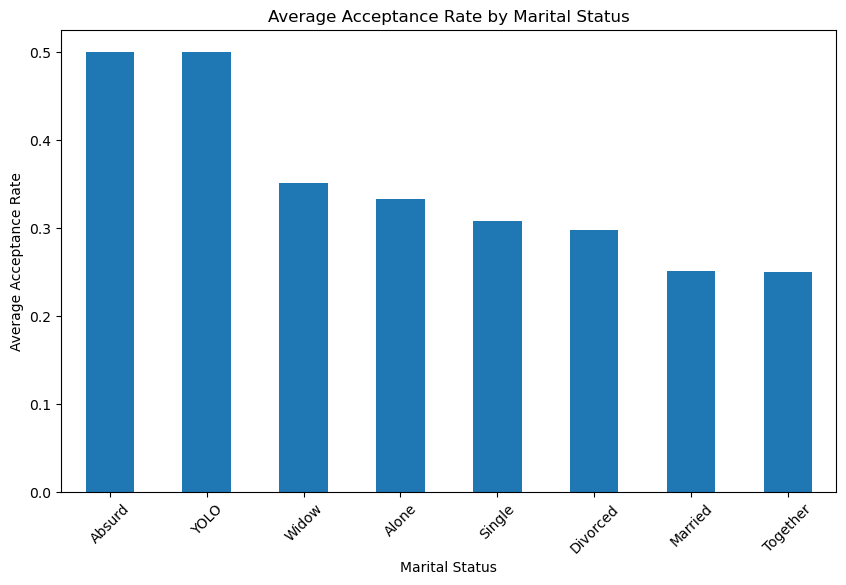

In [175]:
group2.plot(kind='bar', figsize=(10, 6))
plt.title('Average Acceptance Rate by Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Average Acceptance Rate')
plt.xticks(rotation=45)
plt.show()

In [176]:
df_copy.columns

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Total_Children',
       'Total_Spending', 'Customer_Tenure_Days', 'AcceptedAny'],
      dtype='object')

In [177]:
features=['Age','Income','Recency','Total_Spending','NumWebPurchases','NumStorePurchases','NumWebVisitsMonth']

In [178]:
df_copy.isnull().sum()

Year_Birth               0
Education                0
Marital_Status           0
Income                  24
Kidhome                  0
Teenhome                 0
Dt_Customer              0
Recency                  0
MntWines                 0
MntFruits                0
MntMeatProducts          0
MntFishProducts          0
MntSweetProducts         0
MntGoldProds             0
NumDealsPurchases        0
NumWebPurchases          0
NumCatalogPurchases      0
NumStorePurchases        0
NumWebVisitsMonth        0
AcceptedCmp3             0
AcceptedCmp4             0
AcceptedCmp5             0
AcceptedCmp1             0
AcceptedCmp2             0
Complain                 0
Response                 0
Age                      0
Total_Children           0
Total_Spending           0
Customer_Tenure_Days     0
AcceptedAny              0
dtype: int64

In [179]:
df_copy['Income'] = df_copy.groupby('Education')['Income'].transform(
    lambda x: x.fillna(x.median())
)

In [180]:
df_copy.isnull().sum()

Year_Birth              0
Education               0
Marital_Status          0
Income                  0
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
Age                     0
Total_Children          0
Total_Spending          0
Customer_Tenure_Days    0
AcceptedAny             0
dtype: int64

In [181]:
X= df_copy[features]

In [182]:
X

,Age,Income,Recency,Total_Spending,NumWebPurchases,NumStorePurchases,NumWebVisitsMonth
0,68,58138.0,58,1617,8,4,7
1,71,46344.0,38,27,1,2,5
2,60,71613.0,26,776,8,10,4
3,41,26646.0,26,53,2,4,6
4,44,58293.0,94,422,5,6,5
...,...,...,...,...,...,...,...
2235,58,61223.0,46,1341,9,4,5
2236,79,64014.0,56,444,8,5,7
2237,44,56981.0,91,1241,2,13,6
2238,69,69245.0,8,843,6,10,3


In [183]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()

In [184]:
X_scaled= scaler.fit_transform(X)

In [185]:
X_scaled

array([[ 0.98534473,  0.2355009 ,  0.30703926, ...,  1.40930394,
        -0.55078479,  0.69390374],
       [ 1.23573295, -0.23562832, -0.38366418, ..., -1.11040937,
        -1.1661254 , -0.13046347],
       [ 0.3176428 ,  0.77378021, -0.79808624, ...,  1.40930394,
         1.29523705, -0.54264708],
       ...,
       [-1.01776106,  0.18928278,  1.44669994, ..., -0.75045033,
         2.21824797,  0.28172013],
       [ 1.06880747,  0.67918685, -1.41971934, ...,  0.68938585,
         1.29523705, -0.95483068],
       [ 1.23573295,  0.0250227 , -0.31459383, ..., -0.39049128,
        -0.55078479,  0.69390374]])

In [197]:
# Let's use the KMeans and to find the optimal number of clusters using the Elbow Method
from sklearn.cluster import KMeans
wcss= []
for i in range(2, 10):
    kmeans= KMeans(n_clusters= i, random_state= 42)
    # .fit(...) method- trains the KMeans model on the provided data. If the number of clusters is set to 'i', the KMeans algorithm will attempt to partition the data into 'i' distinct clusters based on feature similarities.if the no.of clusters=3, then the .fix(X) makes the algorithm learn 3 cluster centroids from the data.
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

In [193]:
wcss

[10369.69872640078,
 9151.476573041142,
 8366.139784847204,
 7874.907300182113,
 7286.215714508045,
 6916.0296438909045,
 6601.509093660877,
 6317.533968856987]

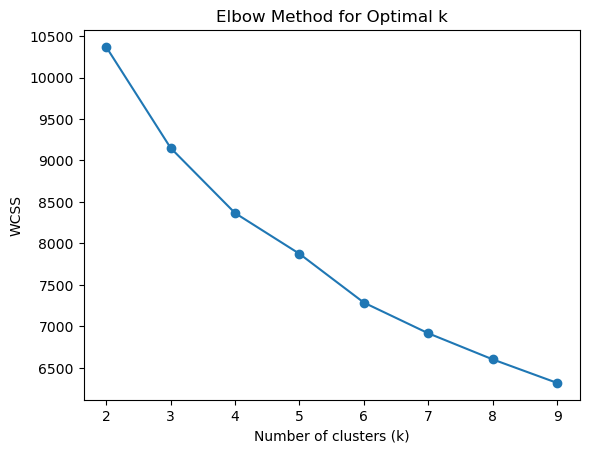

In [194]:
plt.plot(range(2, 10), wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()

In [198]:
kmeans= KMeans(n_clusters= 6, random_state= 42)
# .fit_predict(...) method- combines the fitting and prediction steps. It first fits the KMeans model to the provided data and then assigns each data point to the nearest cluster centroid, returning an array of cluster labels.
# .fit() learns the cluster centers and.predict() assigns each sample in X to one of those clusters.
df_copy['Cluster']= kmeans.fit_predict(X_scaled)

In [196]:
df_copy['Cluster']

0       1
1       0
2       5
3       0
4       3
       ..
2235    1
2236    1
2237    4
2238    2
2239    3
Name: Cluster, Length: 2240, dtype: int32